# Visualización de Mapas de Atención - Ensamble Multi-Plano ACL

Este notebook visualiza los mapas de atención del ensamble multi-plano para interpretar qué slices son más importantes para la decisión de ruptura de ACL.

## Componentes:
- **Sagital, Coronal, Axial**: Tres planos anatómicos independientes
- **Attention Weights**: Pesos aprendidos que indican la importancia de cada slice
- **Ensemble Decision**: Decisión final basada en el promedio de los tres planos

In [1]:
# Imports estándar
import os
import json
import numpy as np
import pandas as pd
from pathlib import Path
from typing import Dict, List, Tuple, Optional
import warnings
warnings.filterwarnings('ignore')

# PyTorch
import torch
import torch.nn as nn
from torch.utils.data import DataLoader

# Scikit-learn
from sklearn.metrics import (
    roc_auc_score, roc_curve, f1_score, precision_score, recall_score,
    confusion_matrix, precision_recall_curve, auc
)

# Visualización
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.gridspec import GridSpec
import seaborn as sns
import cv2
sns.set_style('whitegrid')

# Módulos locales
from gpu_config import device, VIT_GPU_IDS
from models import ViTMultiSliceClassifier
from data_loader import OptimizedMRNetDataset, get_val_test_transform
from ensemble_utils import (
    load_model_for_plane,
    calibrate_threshold,
    compute_metrics
)

print(" Todos los módulos importados exitosamente")

GPU CONFIGURATION
Device: cuda
GPUs disponibles: 4
  GPU 0: NVIDIA H100 PCIe
    Memoria: 85.06 GB
  GPU 1: NVIDIA H100 PCIe
    Memoria: 85.06 GB
  GPU 2: NVIDIA H100 PCIe
    Memoria: 85.06 GB
  GPU 3: NVIDIA H100 PCIe
    Memoria: 85.06 GB

 Asignación de GPUs:
  ViT Training: GPUs [0, 1, 2, 3]
  CNN Pre-processing: GPU 0

 Todos los módulos importados exitosamente


## Configuración Global

In [2]:
# ==========================================
# CONFIGURACIÓN
# ==========================================

# Directorios
CHECKPOINT_DIR = Path('../../checkpoints/acl_classifier_final')
DATA_PATH = Path('../../data')
SLICE_INDICES_DIR = DATA_PATH / 'slice_indices_final'

# Configuración de hiperparámetros
PLANES = ['sagittal', 'coronal', 'axial']
VIT_MODEL_NAME = 'google/vit-base-patch16-224'
NUM_CLASSES = 1
BATCH_SIZE = 32
NUM_WORKERS = 4
SEED = 42

# Configuración por plano
PLANE_POOLING_MODES = {
    'sagittal': 'attention',
    'coronal': 'max',
    'axial': 'attention'
}

PLANE_DROPOUTS = {
    'sagittal': {'input': 0.3, 'dense': 0.2},
    'coronal': {'input': 0.35, 'dense': 0.25},
    'axial': {'input': 0.35, 'dense': 0.25}
}

print(f" Configuración cargada")
print(f"  - Checkpoint: {CHECKPOINT_DIR}")
print(f"  - Planos: {PLANES}")
print(f"  - Pooling modes: {PLANE_POOLING_MODES}")

 Configuración cargada
  - Checkpoint: ../checkpoints/acl_classifier_final
  - Planos: ['sagittal', 'coronal', 'axial']
  - Pooling modes: {'sagittal': 'attention', 'coronal': 'max', 'axial': 'attention'}


## Cargar Modelos del Ensamble

In [3]:
# Cargar modelos
models = {}
print("\nCargando modelos del ensamble:")
print("="*80)

for plane in PLANES:
    checkpoint_path = CHECKPOINT_DIR / f'best_{plane}_auc.pth'

    if not checkpoint_path.exists():
        print(f" Checkpoint no encontrado para {plane}: {checkpoint_path}")
        continue

    print(f"\nCargando {plane.upper()}...")

    model = load_model_for_plane(
        plane=plane,
        checkpoint_path=checkpoint_path,
        device_ids=VIT_GPU_IDS,
        device=device,
        vit_model_name=VIT_MODEL_NAME,
        num_classes=NUM_CLASSES,
        plane_pooling_modes=PLANE_POOLING_MODES,
        plane_dropouts=PLANE_DROPOUTS
    )

    models[plane] = model
    print(f" {plane.upper()} cargado en modo eval")

print("\n" + "="*80)
print(f" {len(models)}/{len(PLANES)} modelos cargados exitosamente")


Cargando modelos del ensamble:

Cargando SAGITTAL...
 Modelo SAGITTAL cargado desde best_sagittal_auc.pth
 SAGITTAL cargado en modo eval

Cargando CORONAL...
 Modelo CORONAL cargado desde best_coronal_auc.pth
 CORONAL cargado en modo eval

Cargando AXIAL...
 Modelo AXIAL cargado desde best_axial_auc.pth
 AXIAL cargado en modo eval

 3/3 modelos cargados exitosamente


## Cargar Dataset

In [4]:
# Cargar validation dataset y crear dataloaders por plano
val_dataloaders = {}

for plane in PLANES:
    val_indices_path = SLICE_INDICES_DIR / f'val_{plane}_indices.json'

    val_dataset = OptimizedMRNetDataset(
        csv_path=DATA_PATH / 'val-acl.csv',
        data_root=DATA_PATH / 'val',
        plane=plane,
        indices_cache_path=val_indices_path,
        augmentation_mode=None,
        transform=get_val_test_transform()
    )

    val_dataloaders[plane] = DataLoader(
        val_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=NUM_WORKERS,
        drop_last=False,
        pin_memory=True
    )

# Guardar primera referencia de dataset para visualización
val_dataset_for_viz = val_dataset

print(f" Dataset cargado para {len(PLANES)} planos")
print(f"  - Muestras en validación: {len(val_dataset)}")
print(f"  - Batch size: {BATCH_SIZE}")

 Dataset cargado: 188 casos
  Plane: sagittal
  Augmentation: None (usando transform directo)
  Índices cacheados: ../data/slice_indices_final/val_sagittal_indices.json
 Dataset cargado: 188 casos
  Plane: coronal
  Augmentation: None (usando transform directo)
  Índices cacheados: ../data/slice_indices_final/val_coronal_indices.json
 Dataset cargado: 188 casos
  Plane: axial
  Augmentation: None (usando transform directo)
  Índices cacheados: ../data/slice_indices_final/val_axial_indices.json
 Dataset cargado para 3 planos
  - Muestras en validación: 188
  - Batch size: 32


## Función para Extraer Mapas de Atención

In [31]:
def get_case_prediction_with_attention(
    case_idx: int,
    models: Dict[str, nn.Module],
    dataloaders: Dict[str, DataLoader],
    planes: List[str],
    device: torch.device
) -> Dict:
    """
    Obtener predicción y mapas de atención para UN ÚNICO CASO.

    Args:
        case_idx: Índice del caso a procesar (0 es el primero)
        models: Dict con modelos para cada plano
        dataloaders: Dict con dataloaders para cada plano
        planes: Lista de nombres de planos
        device: torch device

    Returns:
        Dict con:
        - probs_per_plane: Dict[plane] -> probabilidad para este caso
        - attention_maps_per_plane: Dict[plane] -> attention weights para este caso
        - slices_per_plane: Dict[plane] -> imágenes de slices
        - ensemble_prob: Probabilidad final del ensemble
        - target: Etiqueta del caso
        - case_id: ID del caso
    """

    case_probs = {}
    case_attention = {}
    case_slices = {}
    case_target = None
    case_id = None

    print(f"\nProcesando caso index={case_idx}...")
    print(f"{'='*80}\n")

    with torch.no_grad():
        for plane in planes:
            dataloader = dataloaders[plane]
            model = models[plane]

 # Iterar hasta encontrar el batch que contiene nuestro caso
            sample_count = 0
            found = False

            for batch_slices, batch_targets, batch_case_ids in dataloader:
                batch_size = batch_slices.shape[0]

 # ¿Está nuestro caso en este batch?
                if sample_count <= case_idx < sample_count + batch_size:
 # Índice dentro del batch
                    local_idx = case_idx - sample_count

 # Procesar este batch
                    batch_slices = batch_slices.to(device)
                    outputs = model(batch_slices)

                    if isinstance(outputs, tuple):
                        logits, attention_weights = outputs
                    else:
                        logits = outputs
                        attention_weights = None

 # Extraer predicción del caso
                    prob = torch.sigmoid(logits[local_idx]).item()
                    case_probs[plane] = prob

 # Extraer attention weights si están disponibles
                    if attention_weights is not None:
                        case_attention[plane] = attention_weights[local_idx].detach().cpu().numpy()
                    else:
                        case_attention[plane] = None

 # Guardar slices
                    case_slices[plane] = batch_slices[local_idx].detach().cpu()

 # Guardar target y case_id (solo una vez)
                    if case_target is None:
                        case_target = batch_targets[local_idx].item()
                        case_id = batch_case_ids[local_idx]

                    print(f" {plane.upper():10s} — Prob: {prob:.4f}")
                    found = True
                    break

                sample_count += batch_size

            if not found:
                print(f" Caso {case_idx} no encontrado para plano {plane}")
                return None

 # Ensemble
    ensemble_prob = np.mean([case_probs[plane] for plane in planes])

    print(f"\n{'='*80}")
    print(f"Ensemble Prob: {ensemble_prob:.4f}")
    print(f"Predicción: {'ACL ROTO ' if ensemble_prob > 0.5 else 'ACL NORMAL '}")
    print(f"Etiqueta real: {'ACL ROTO' if case_target == 1 else 'ACL NORMAL'}")
    print(f"{'='*80}\n")

    return {
        'probs_per_plane': case_probs,
        'attention_maps_per_plane': case_attention,
        'slices_per_plane': case_slices,
        'ensemble_prob': ensemble_prob,
        'target': case_target,
        'case_id': case_id
    }

print(" Función get_case_prediction_with_attention definida")

 Función get_case_prediction_with_attention definida


## Ejecutar Inferencia

In [32]:
# Obtener predicciones de algunos casos de ejemplo

# Primero, iteramos para encontrar ejemplos de cada categoría
print("Buscando ejemplos de casos...\n")

# Detectar cuántos casos hay en el conjunto
n_cases = 0
for _, _, _ in val_dataloaders['sagittal']:
    n_cases += len(val_dataloaders['sagittal'].dataset)
    break

print(f"Total de casos en validación: {n_cases}")

# Buscar ejemplos
example_cases = {
    'positive_correct': None,
    'negative_correct': None,
    'error': None
}

for case_idx in range(min(n_cases, 50)):  # Buscar en los primeros 50 casos
    result = get_case_prediction_with_attention(
        case_idx=case_idx,
        models=models,
        dataloaders=val_dataloaders,
        planes=PLANES,
        device=device
    )

    if result is None:
        continue

    ensemble_pred = 1 if result['ensemble_prob'] > 0.5 else 0
    is_correct = ensemble_pred == result['target']

 # Guardar ejemplos
    if is_correct and result['target'] == 1 and example_cases['positive_correct'] is None:
        example_cases['positive_correct'] = (case_idx, result)
        print(f" Encontrado: ACL ROTO bien detectado (case {case_idx})")

    elif is_correct and result['target'] == 0 and example_cases['negative_correct'] is None:
        example_cases['negative_correct'] = (case_idx, result)
        print(f" Encontrado: ACL NORMAL bien detectado (case {case_idx})")

    elif not is_correct and example_cases['error'] is None:
        example_cases['error'] = (case_idx, result)
        print(f" Encontrado: PREDICCIÓN INCORRECTA (case {case_idx})")

 # Si ya tenemos ejemplos de 3 categorías, parar
    if all(example_cases.values()):
        break

print(f"\n{'='*80}")
print(f"EJEMPLOS ENCONTRADOS:")
for cat, value in example_cases.items():
    if value:
        print(f"   {cat}: case {value[0]}")
    else:
        print(f"   {cat}: no encontrado")
print(f"{'='*80}\n")

Buscando ejemplos de casos...

Total de casos en validación: 188

Procesando caso index=0...

 SAGITTAL   — Prob: 0.1265
 CORONAL    — Prob: 0.0744
 AXIAL      — Prob: 0.1572

Ensemble Prob: 0.1194
Predicción: ACL NORMAL
Etiqueta real: ACL NORMAL

 Encontrado: ACL NORMAL bien detectado (case 0)

Procesando caso index=1...

 SAGITTAL   — Prob: 0.1882
 CORONAL    — Prob: 0.1252
 AXIAL      — Prob: 0.5584

Ensemble Prob: 0.2906
Predicción: ACL NORMAL
Etiqueta real: ACL NORMAL


Procesando caso index=2...

 SAGITTAL   — Prob: 0.0936
 CORONAL    — Prob: 0.5247
 AXIAL      — Prob: 0.1765

Ensemble Prob: 0.2649
Predicción: ACL NORMAL
Etiqueta real: ACL NORMAL


Procesando caso index=3...

 SAGITTAL   — Prob: 0.1175
 CORONAL    — Prob: 0.9600
 AXIAL      — Prob: 0.9755

Ensemble Prob: 0.6843
Predicción: ACL ROTO
Etiqueta real: ACL NORMAL

 Encontrado: PREDICCIÓN INCORRECTA (case 3)

Procesando caso index=4...

 SAGITTAL   — Prob: 0.2004
 CORONAL    — Prob: 0.1340
 AXIAL      — Prob: 0.2350

En

## Función para Visualizar Mapas de Atención

In [30]:
def visualize_case_attention(
    case_result: Dict,
    planes: List[str],
    threshold: float = 0.5,
    top_k_slices: int = 5,
    figsize: Tuple = (18, 12)
) -> plt.Figure:
    """
    Visualizar mapas de atención para UN CASO.

    Args:
        case_result: Dict retornado por get_case_prediction_with_attention
        planes: Lista de planos
        threshold: Umbral de decisión
        top_k_slices: Número de top slices a mostrar por plano
        figsize: Tamaño de la figura

    Returns:
        matplotlib.figure.Figure
    """

 # Información del caso
    case_id = case_result['case_id']
    target = case_result['target']
    ensemble_prob = case_result['ensemble_prob']

 # Crear figura
    fig = plt.figure(figsize=figsize)
    gs = GridSpec(3, 3, figure=fig, hspace=0.4, wspace=0.3)

 # Título principal
    prediction = "ACL ROTO" if ensemble_prob > threshold else "ACL NORMAL"
    actual = "ACL ROTO" if target == 1 else "ACL NORMAL"
    is_correct = " CORRECTO" if (ensemble_prob > threshold) == target else " INCORRECTO"

    title = f'Mapas de Atención - Case ID: {case_id}\n'
    title += f'Predicción: {prediction} ({ensemble_prob:.3f}) | Actual: {actual} | {is_correct}'
    fig.suptitle(title, fontsize=14, fontweight='bold', y=0.98)

 # Procesar cada plano
    for plane_idx, plane in enumerate(planes):
        plane_prob = case_result['probs_per_plane'][plane]
        attn_weights = case_result['attention_maps_per_plane'][plane]
        plane_slices = case_result['slices_per_plane'][plane]  # (num_slices, C, H, W)

        has_attention = attn_weights is not None

 # Seleccionar top slices
        if has_attention:
            top_indices = np.argsort(attn_weights)[-top_k_slices:][::-1]
        else:
            total_slices = plane_slices.shape[0]
            top_indices = np.linspace(0, total_slices - 1, top_k_slices).astype(int)

 # Visualizar top 3 slices
        for sub_idx, slice_idx in enumerate(top_indices[:3]):
            ax = fig.add_subplot(gs[plane_idx, sub_idx])

            try:
                slice_img = plane_slices[slice_idx].numpy()  # (C, H, W)

 # Convertir a escala de grises si es RGB
                if slice_img.ndim == 3 and slice_img.shape[0] == 3:
                    slice_img = np.dot(slice_img.transpose(1, 2, 0)[...,:3], [0.2989, 0.5870, 0.1140])
                elif slice_img.ndim == 3 and slice_img.shape[0] == 1:
                    slice_img = slice_img[0]

 # Normalizar
                if slice_img.max() > 1.0:
                    slice_img = slice_img / 255.0

                ax.imshow(slice_img, cmap='gray')

 # Título con peso de atención
                if has_attention:
                    attn_weight = attn_weights[slice_idx]
                    title_text = f'Slice {slice_idx}\nAttn: {attn_weight:.3f}'
                    color = 'red' if attn_weight > np.percentile(attn_weights, 75) else 'white'
                    ax.set_title(title_text, fontsize=10, color=color, fontweight='bold')
                else:
                    ax.set_title(f'Slice {slice_idx}', fontsize=10)

                ax.axis('off')

            except Exception as e:
                ax.text(0.5, 0.5, f'Error: {str(e)[:30]}',
                       ha='center', va='center', transform=ax.transAxes, fontsize=9)
                ax.axis('off')

 # Gráfico de distribución de attention
        ax = fig.add_subplot(gs[plane_idx, 2])
        if has_attention:
            colors = ['red' if w > np.percentile(attn_weights, 75) else 'steelblue'
                     for w in attn_weights]
            ax.bar(range(len(attn_weights)), attn_weights, color=colors, alpha=0.7)
            ax.set_xlabel('Slice Index')
            ax.set_ylabel('Attention Weight')
            ax.set_title(f'{plane.upper()}\nMapas de Atención\nProb: {plane_prob:.3f}')
        else:
            ax.text(0.5, 0.5, f'{plane.upper()}\nPooling: Max\n(sin attention)',
                   ha='center', va='center', transform=ax.transAxes, fontsize=11)
            ax.set_title(f'Prob: {plane_prob:.3f}')

        ax.grid(True, alpha=0.3)

    return fig

print(" Función visualize_case_attention definida")

 Función visualize_case_attention definida


In [36]:
def find_example_cases_coronal_correct(
    val_dataloaders: Dict[str, DataLoader],
    example_cases: Dict,
    target_label: int,
    num_examples: int = 3,
    threshold: float = 0.5
) -> Dict:
    """
    Encontrar casos donde CORONAL predice CORRECTAMENTE,
    usando la estructura de example_cases existente.
    """

    examples = {'correct_coronal': []}
    count = 0

 # Iterar sobre example_cases (que puede contener tuplas)
    for category, case_data in example_cases.items():
        if case_data is None:
            continue

 # case_data es una tupla (case_idx, result)
        if isinstance(case_data, tuple):
            case_idx, result = case_data
        else:
            continue

        target = result['target']
        ensemble_prob = result['ensemble_prob']
        coronal_prob = result['probs_per_plane']['coronal']

 # Verificar que coronal predice correctamente
        coronal_pred = 1 if coronal_prob > threshold else 0
        coronal_correct = (coronal_pred == target)

 # Verificar que matching con target_label
        if coronal_correct and target == target_label:
            examples['correct_coronal'].append({
                'case_id': case_idx,
                'target': target,
                'ensemble_prob': ensemble_prob,
                'coronal_prob': coronal_prob,
                'result': result
            })
            count += 1

        if count >= num_examples:
            break

    print(f" Encontrados {len(examples['correct_coronal'])} casos con Coronal CORRECTO (label={target_label})")
    return examples

## Ejemplos de Predicción Individual

In [38]:
def visualize_case_top5_slices(
    case_result: Dict,
    planes: List[str],
    models: Dict[str, nn.Module],
    device: torch.device,
    threshold: float = 0.5,
    figsize: Tuple = (22, 14)
) -> plt.Figure:
    """
    Visualizar UN CASO con los 5 SLICES MÁS IMPORTANTES para cada plano.
    Cada slice muestra: imagen original + heatmap superpuesto (más transparente, alpha=0.3).
    """

    case_id = case_result['case_id']
    target = case_result['target']
    ensemble_prob = case_result['ensemble_prob']

    fig = plt.figure(figsize=figsize)

 # Título
    prediction = "ACL ROTO" if ensemble_prob > threshold else "ACL NORMAL"
    actual = "ACL ROTO" if target == 1 else "ACL NORMAL"
    is_correct = " CORRECTO" if (ensemble_prob > threshold) == target else " INCORRECTO"
    title = f'Top 5 Slices - Case {case_id} | Predicción: {prediction} ({ensemble_prob:.3f}) | Real: {actual} | {is_correct}'
    fig.suptitle(title, fontsize=14, fontweight='bold', y=0.98)

    for plane_idx, plane in enumerate(planes):
        attn_weights = case_result['attention_maps_per_plane'][plane]
        plane_slices = case_result['slices_per_plane'][plane]
        plane_prob = case_result['probs_per_plane'][plane]

        has_attention = attn_weights is not None
        model = models[plane]

 # Obtener top 5 slices
        if has_attention:
            top5_indices = np.argsort(attn_weights)[-5:][::-1]  # Top 5 en orden decreciente
        else:
 # Si no hay attention, distribuir equidistante
            n_slices = plane_slices.shape[0]
            top5_indices = np.linspace(0, n_slices - 1, 5, dtype=int)

 # Crear subplots para este plano: 5 columnas
        for col_idx, slice_idx in enumerate(top5_indices):
            ax = fig.add_subplot(3, 5, plane_idx * 5 + col_idx + 1)

            slice_img = plane_slices[int(slice_idx)].numpy()

 # Convertir a escala de grises
            if slice_img.ndim == 3 and slice_img.shape[0] == 3:
                slice_img_gray = np.dot(slice_img.transpose(1, 2, 0)[...,:3], [0.2989, 0.5870, 0.1140])
            elif slice_img.ndim == 3 and slice_img.shape[0] == 1:
                slice_img_gray = slice_img[0]
            else:
                slice_img_gray = slice_img

 # Normalizar
            if slice_img_gray.max() > 1.0:
                slice_img_gray = slice_img_gray / 255.0

 # Mostrar imagen en escala de grises
            ax.imshow(slice_img_gray, cmap='gray')

 # Generar y superponer heatmap (MÁS TRANSPARENTE)
            print(f"   {plane.upper()} slice #{slice_idx}...", end=" ")
            try:
                heatmap = get_vit_attention_heatmap(
                    plane_slices[int(slice_idx)],
                    model,
                    device,
                    patch_size=16
                )

 # Superponer heatmap con MAYOR TRANSPARENCIA (alpha=0.3 en lugar de 0.5)
                im2 = ax.imshow(heatmap, cmap='hot', alpha=0.3, vmin=0, vmax=1)
                print("")

            except Exception as e:
                print(f" ({str(e)[:20]})")

 # Título con índice y peso
            if has_attention:
                weight = attn_weights[int(slice_idx)]
                ax.set_title(f'#{slice_idx}\nW:{weight:.3f}', fontsize=9, fontweight='bold')
            else:
                ax.set_title(f'#{slice_idx}', fontsize=9)

            ax.axis('off')

 # Etiqueta del plano en la izquierda
        ax_label = fig.add_axes([0.02, 0.7 - plane_idx * 0.32, 0.02, 0.15])
        ax_label.text(0.5, 0.5, f'{plane.upper()}\nProb: {plane_prob:.3f}',
                     ha='center', va='center', fontsize=12, fontweight='bold',
                     transform=ax_label.transAxes, rotation=0)
        ax_label.axis('off')

    plt.tight_layout(rect=[0.05, 0, 1, 0.96])
    return fig

print(" Función visualize_case_top5_slices cargada")

 Función visualize_case_top5_slices cargada


### Ejemplo 1: ACL Roto Detectado Correctamente


TOP 5 SLICES - CASOS CON CORONAL PREDICCIÓN CORRECTA

 ACL ROTO - Coronal Correcto:
 Encontrados 1 casos con Coronal CORRECTO (label=1)

   Case 11: Coronal=0.612
   SAGITTAL slice #0...     Gradients - Std: 0.002140, Max: 0.013331
    Heatmap (Gradients) - Std: 0.002140

   SAGITTAL slice #2...     Gradients - Std: 0.003262, Max: 0.033286
    Heatmap (Gradients) - Std: 0.003262

   SAGITTAL slice #3...     Gradients - Std: 0.003043, Max: 0.023667
    Heatmap (Gradients) - Std: 0.003043

   SAGITTAL slice #4...     Gradients - Std: 0.001197, Max: 0.007296
    Heatmap (Gradients) - Std: 0.001197

   SAGITTAL slice #1...     Gradients - Std: 0.001400, Max: 0.013966
    Heatmap (Gradients) - Std: 0.001400

   CORONAL slice #0...     Gradients - Std: 0.001544, Max: 0.007388
    Heatmap (Gradients) - Std: 0.001544

   CORONAL slice #2...     Gradients - Std: 0.001081, Max: 0.006464
    Heatmap (Gradients) - Std: 0.001081

   CORONAL slice #4...     Gradients - Std: 0.003913, Max: 0.040384


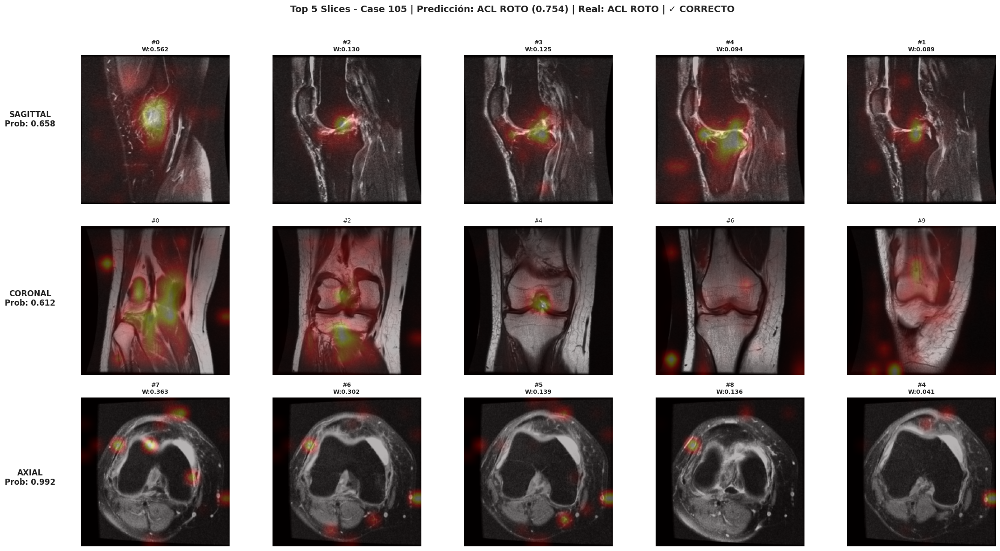


 Análisis de top 5 slices completado


In [39]:
print("\n" + "="*80)
print("TOP 5 SLICES - CASOS CON CORONAL PREDICCIÓN CORRECTA")
print("="*80)

# Buscar casos donde CORONAL predice correctamente - ACL ROTO
print("\n ACL ROTO - Coronal Correcto:")
coronal_correct_cases = find_example_cases_coronal_correct(
    val_dataloaders,
    example_cases,
    target_label=1,
    num_examples=2,
    threshold=0.5
)

for case_info in coronal_correct_cases['correct_coronal']:
    case_id = case_info['case_id']
    case_result = case_info['result']

    print(f"\n   Case {case_id}: Coronal={case_info['coronal_prob']:.3f}")

    fig = visualize_case_top5_slices(
        case_result,
        planes=['sagittal', 'coronal', 'axial'],
        models=models,
        device=device,
        threshold=0.5,
        figsize=(22, 12)
    )
    plt.show()

print("\n Análisis de top 5 slices completado")

### Ejemplo 2: ACL Normal Detectado Correctamente

## Top 5 Slices - ACL NORMAL con Coronal Correcto


TOP 5 SLICES - ACL NORMAL CON CORONAL PREDICCIÓN CORRECTA

 ACL NORMAL - Coronal Correcto:
 Encontrados 1 casos con Coronal CORRECTO (label=0)

   Case 0: Coronal=0.074
   SAGITTAL slice #2...     Gradients - Std: 0.000594, Max: 0.007654
    Perturbation - 20 parches testados
    Heatmap (Perturbation-based)

   SAGITTAL slice #3...     Gradients - Std: 0.001151, Max: 0.008994
    Heatmap (Gradients) - Std: 0.001151

   SAGITTAL slice #1...     Gradients - Std: 0.000923, Max: 0.010114
    Perturbation - 20 parches testados
    Heatmap (Perturbation-based)

   SAGITTAL slice #4...     Gradients - Std: 0.000444, Max: 0.003014
    Perturbation - 20 parches testados
    Heatmap (Perturbation-based)

   SAGITTAL slice #0...     Gradients - Std: 0.001645, Max: 0.010381
    Heatmap (Gradients) - Std: 0.001645

   CORONAL slice #0...     Gradients - Std: 0.001906, Max: 0.011302
    Heatmap (Gradients) - Std: 0.001906

   CORONAL slice #2...     Gradients - Std: 0.000509, Max: 0.004138
    Per

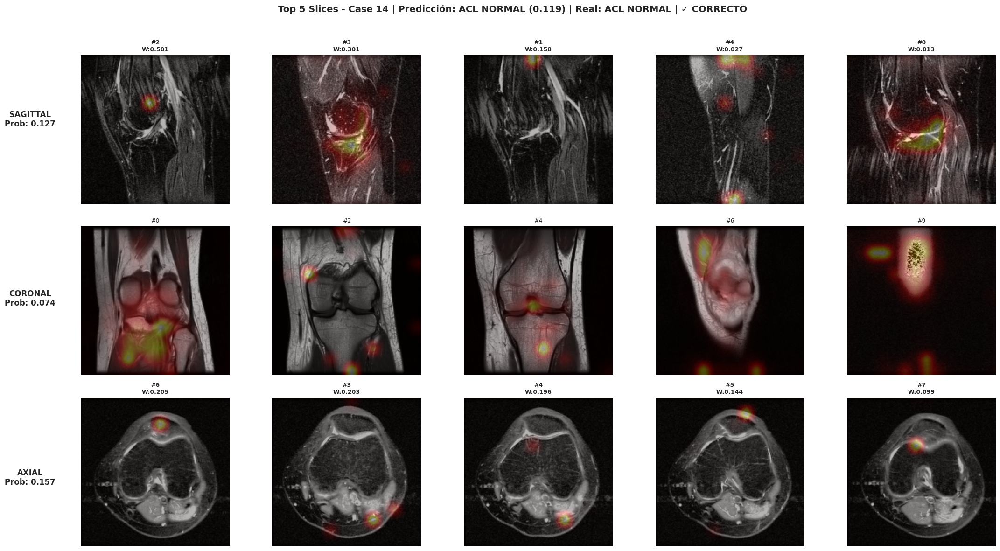


 Top 5 slices para casos normales - Análisis completado


In [41]:
print("\n" + "="*80)
print("TOP 5 SLICES - ACL NORMAL CON CORONAL PREDICCIÓN CORRECTA")
print("="*80)

# Buscar casos donde CORONAL predice correctamente - ACL NORMAL
print("\n ACL NORMAL - Coronal Correcto:")
coronal_correct_normal = find_example_cases_coronal_correct(
    val_dataloaders,
    example_cases,
    target_label=0,
    num_examples=2,
    threshold=0.5
)

for case_info in coronal_correct_normal['correct_coronal']:
    case_id = case_info['case_id']
    case_result = case_info['result']

    print(f"\n   Case {case_id}: Coronal={case_info['coronal_prob']:.3f}")

    fig = visualize_case_top5_slices(
        case_result,
        planes=['sagittal', 'coronal', 'axial'],
        models=models,
        device=device,
        threshold=0.5,
        figsize=(22, 12)
    )
    plt.show()

print("\n Top 5 slices para casos normales - Análisis completado")


EJEMPLO 2: ACL NORMAL - DETECTADO CORRECTAMENTE


   Generando heatmap para SAGITTAL slice 2...
    Gradients - Std: 0.000594, Max: 0.007654
    Perturbation - 20 parches testados
    Heatmap (Perturbation-based)

   Generando heatmap para CORONAL slice 5...
    Gradients - Std: 0.001143, Max: 0.006078
    Heatmap (Gradients) - Std: 0.001143

   Generando heatmap para AXIAL slice 6...
    Gradients - Std: 0.000635, Max: 0.006174
    Perturbation - 20 parches testados
    Heatmap (Perturbation-based)


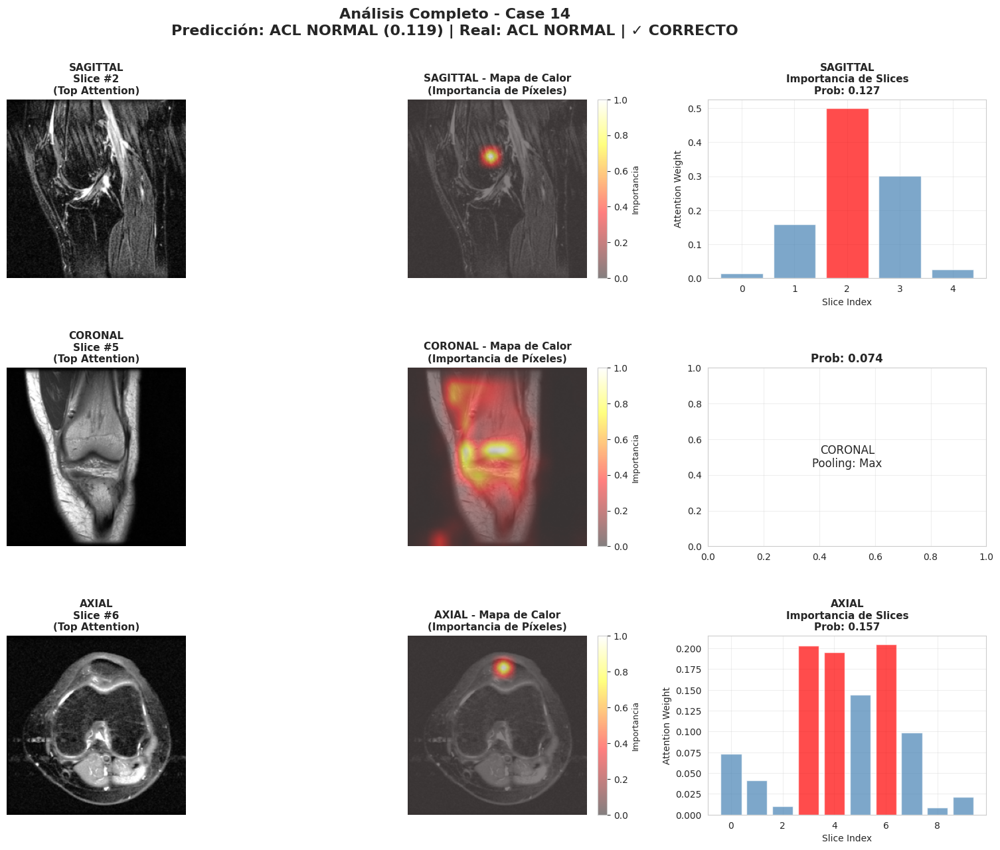

In [40]:
if example_cases['negative_correct']:
    case_idx, case_result = example_cases['negative_correct']
    print(f"\n{'='*80}")
    print(f"EJEMPLO 2: ACL NORMAL - DETECTADO CORRECTAMENTE")
    print(f"{'='*80}\n")
    fig = visualize_case_with_heatmaps(
        case_result,
        planes=PLANES,
        models=models,
        device=device,
        threshold=0.5
    )
    plt.tight_layout()
    plt.show()
else:
    print("No se encontró ejemplo de ACL normal bien detectado")

## Top 5 Slices - Casos con Error en Coronal


TOP 5 SLICES - CASOS CON ERROR EN CORONAL (COMPARACIÓN)

 Coronal INCORRECTO:
 Encontrados 1 casos con Coronal INCORRECTO

   Case 3: Real=ACL NORMAL, Coronal Pred=ACL ROTO, Prob=0.960
   SAGITTAL slice #2...     Gradients - Std: 0.000937, Max: 0.008276
    Perturbation - 20 parches testados
    Heatmap (Perturbation-based)

   SAGITTAL slice #3...     Gradients - Std: 0.000572, Max: 0.004357
    Perturbation - 20 parches testados
    Heatmap (Perturbation-based)

   SAGITTAL slice #4...     Gradients - Std: 0.002099, Max: 0.012519
    Heatmap (Gradients) - Std: 0.002099

   SAGITTAL slice #1...     Gradients - Std: 0.002891, Max: 0.033364
    Heatmap (Gradients) - Std: 0.002891

   SAGITTAL slice #0...     Gradients - Std: 0.001531, Max: 0.008265
    Heatmap (Gradients) - Std: 0.001531

   CORONAL slice #0...     Gradients - Std: 0.001734, Max: 0.008380
    Heatmap (Gradients) - Std: 0.001734

   CORONAL slice #2...     Gradients - Std: 0.000449, Max: 0.002033
    Perturbation - 20 p

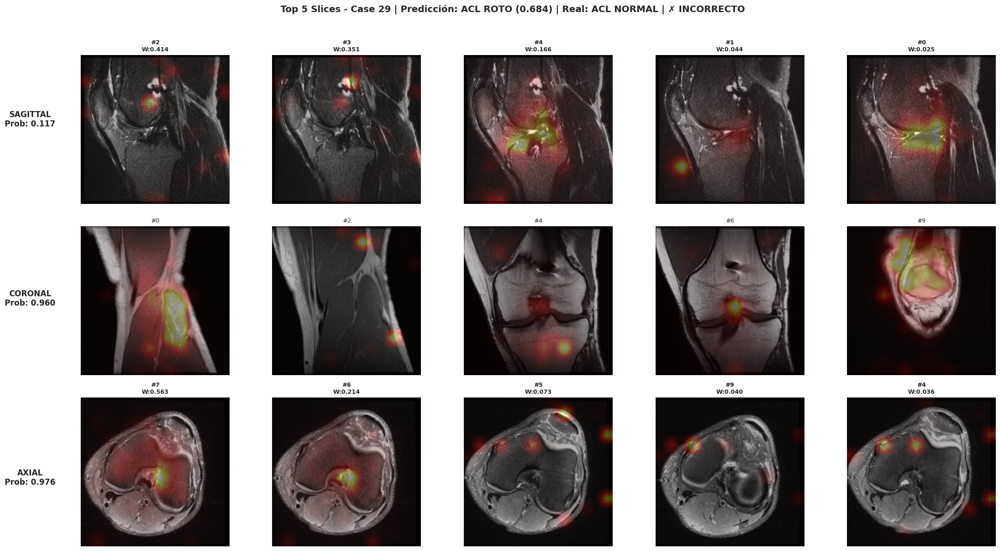


 Análisis de errores en Coronal completado


In [43]:
def find_example_cases_coronal_incorrect(
    example_cases: Dict,
    num_examples: int = 2,
    threshold: float = 0.5
) -> Dict:
    """
    Encontrar casos donde CORONAL predice INCORRECTAMENTE.
    Útil para comparar contra casos correctos.
    """

    examples = {'incorrect_coronal': []}
    count = 0

 # Iterar sobre example_cases
    for category, case_data in example_cases.items():
        if case_data is None:
            continue

 # case_data es una tupla (case_idx, result)
        if isinstance(case_data, tuple):
            case_idx, result = case_data
        else:
            continue

        target = result['target']
        ensemble_prob = result['ensemble_prob']
        coronal_prob = result['probs_per_plane']['coronal']

 # Verificar que coronal predice INCORRECTAMENTE
        coronal_pred = 1 if coronal_prob > threshold else 0
        coronal_incorrect = (coronal_pred != target)

        if coronal_incorrect:
            examples['incorrect_coronal'].append({
                'case_id': case_idx,
                'target': target,
                'coronal_pred': coronal_pred,
                'ensemble_prob': ensemble_prob,
                'coronal_prob': coronal_prob,
                'result': result
            })
            count += 1

        if count >= num_examples:
            break

    print(f" Encontrados {len(examples['incorrect_coronal'])} casos con Coronal INCORRECTO")
    return examples


print("\n" + "="*80)
print("TOP 5 SLICES - CASOS CON ERROR EN CORONAL (COMPARACIÓN)")
print("="*80)

# Buscar casos donde CORONAL predice incorrectamente
print("\n Coronal INCORRECTO:")
coronal_incorrect_cases = find_example_cases_coronal_incorrect(
    example_cases,
    num_examples=2,
    threshold=0.5
)

for case_info in coronal_incorrect_cases['incorrect_coronal']:
    case_id = case_info['case_id']
    case_result = case_info['result']
    target_label = "ACL ROTO" if case_info['target'] == 1 else "ACL NORMAL"
    coronal_pred = "ACL ROTO" if case_info['coronal_pred'] == 1 else "ACL NORMAL"

    print(f"\n   Case {case_id}: Real={target_label}, Coronal Pred={coronal_pred}, Prob={case_info['coronal_prob']:.3f}")

    fig = visualize_case_top5_slices(
        case_result,
        planes=['sagittal', 'coronal', 'axial'],
        models=models,
        device=device,
        threshold=0.5,
        figsize=(22, 12)
    )
    plt.show()

print("\n Análisis de errores en Coronal completado")

### Ejemplo 3: Predicción Incorrecta (si existe)


EJEMPLO 3: PREDICCIÓN INCORRECTA


   Generando heatmap para SAGITTAL slice 2...
    Gradients - Std: 0.000937, Max: 0.008276
    Perturbation - 20 parches testados
    Heatmap (Perturbation-based)

   Generando heatmap para CORONAL slice 5...
    Gradients - Std: 0.001745, Max: 0.016565
    Heatmap (Gradients) - Std: 0.001745

   Generando heatmap para AXIAL slice 7...
    Gradients - Std: 0.001122, Max: 0.009115
    Heatmap (Gradients) - Std: 0.001122


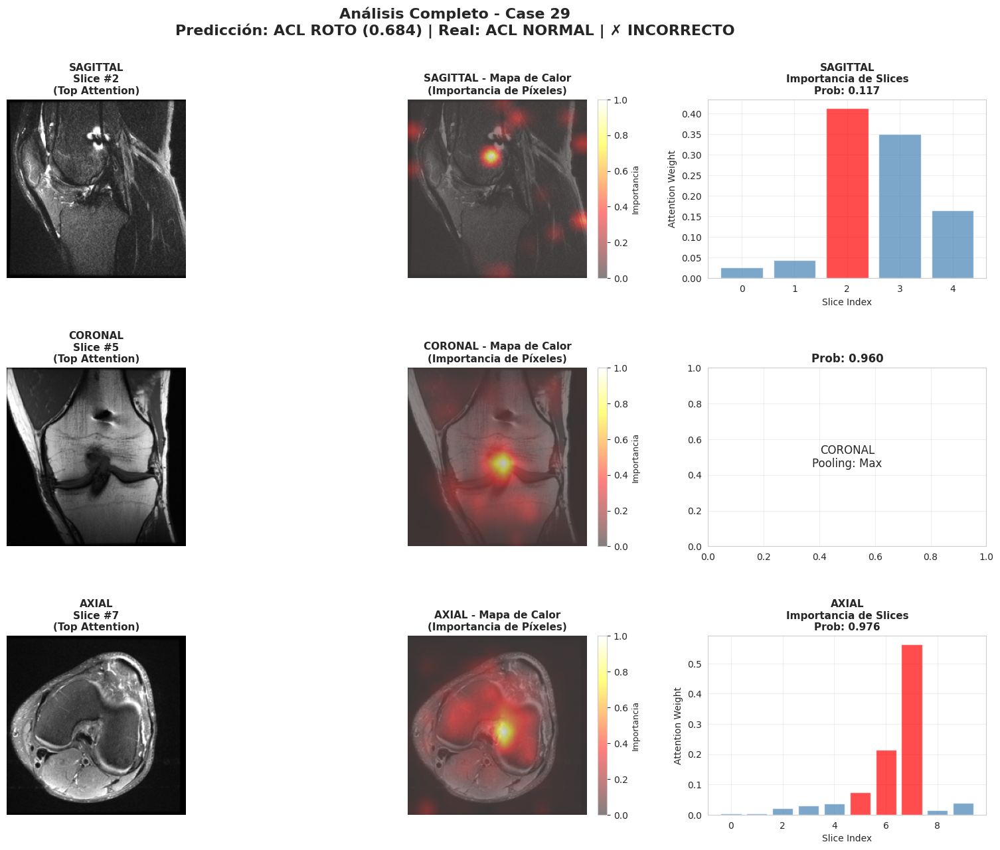

In [28]:
if example_cases['error']:
    case_idx, case_result = example_cases['error']
    print(f"\n{'='*80}")
    print(f"EJEMPLO 3: PREDICCIÓN INCORRECTA")
    print(f"{'='*80}\n")
    fig = visualize_case_with_heatmaps(
        case_result,
        planes=PLANES,
        models=models,
        device=device,
        threshold=0.5
    )
    plt.tight_layout()
    plt.show()
else:
    print("No se encontraron errores de predicción en los primeros 50 casos")

## Análisis de Patrones de Atención

## UN CASO: ACL ROTO - DETECTADO CORRECTAMENTE


 CASO DE ACL ROTO - DETECTADO CORRECTAMENTE

 CASO #11
   ├─ Diagnóstico Real: ACL ROTO
   ├─ Predicción del Modelo: ACL ROTO (75.4%)
   └─ Resultado:  CORRECTO

 Probabilidades por Plano:
   • SAGITTAL: 0.658
   • CORONAL: 0.612
   • AXIAL: 0.992

 Mostrando 5 Slices más Importantes para cada Plano...

   SAGITTAL slice #0...     Gradients - Std: 0.002140, Max: 0.013331
    Heatmap (Gradients) - Std: 0.002140

   SAGITTAL slice #2...     Gradients - Std: 0.003262, Max: 0.033286
    Heatmap (Gradients) - Std: 0.003262

   SAGITTAL slice #3...     Gradients - Std: 0.003043, Max: 0.023667
    Heatmap (Gradients) - Std: 0.003043

   SAGITTAL slice #4...     Gradients - Std: 0.001197, Max: 0.007296
    Heatmap (Gradients) - Std: 0.001197

   SAGITTAL slice #1...     Gradients - Std: 0.001400, Max: 0.013966
    Heatmap (Gradients) - Std: 0.001400

   CORONAL slice #0...     Gradients - Std: 0.001544, Max: 0.007388
    Heatmap (Gradients) - Std: 0.001544

   CORONAL slice #2...     Gradient

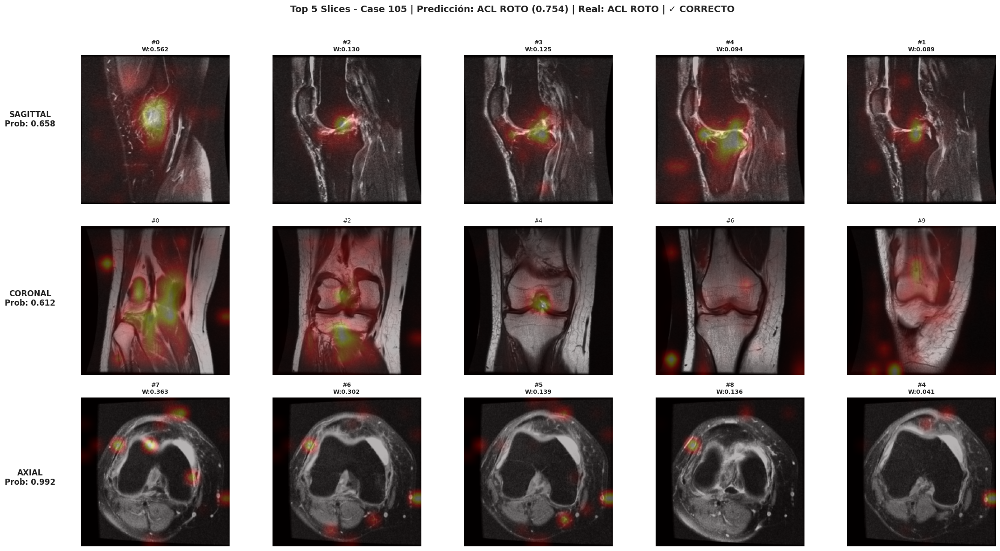


 Visualización completada
   Los números (#) indican el índice del slice
   Los valores (W:) indican el peso/importancia de ese slice
   Los mapas de calor (rojo/amarillo) muestran dónde se fija el modelo


In [44]:
print("\n" + "="*80)
print(" CASO DE ACL ROTO - DETECTADO CORRECTAMENTE")
print("="*80)

# Obtener el caso positivo correcto (donde está realmente roto y se predice roto)
if example_cases['positive_correct']:
    case_idx, case_result = example_cases['positive_correct']

    print(f"\n CASO #{case_idx}")
    print(f"   ├─ Diagnóstico Real: ACL ROTO")
    print(f"   ├─ Predicción del Modelo: ACL ROTO ({case_result['ensemble_prob']:.1%})")
    print(f"   └─ Resultado:  CORRECTO\n")

 # Mostrar probabilidades por plano
    print(" Probabilidades por Plano:")
    for plane in ['sagittal', 'coronal', 'axial']:
        prob = case_result['probs_per_plane'][plane]
        print(f"   • {plane.upper()}: {prob:.3f}")

    print("\n Mostrando 5 Slices más Importantes para cada Plano...\n")

    fig = visualize_case_top5_slices(
        case_result,
        planes=['sagittal', 'coronal', 'axial'],
        models=models,
        device=device,
        threshold=0.5,
        figsize=(22, 12)
    )
    plt.show()

    print("\n Visualización completada")
    print("   Los números (#) indican el índice del slice")
    print("   Los valores (W:) indican el peso/importancia de ese slice")
    print("   Los mapas de calor (rojo/amarillo) muestran dónde se fija el modelo")
else:
    print("  No se encontró caso positivo correcto")

In [11]:
# NOTA: Esta sección es OPCIONAL
# Si quieres analizar patrones en TODO el conjunto de validación, descomenta el código
# Por ahora nos enfocamos en ejemplos individuales

print("\n" + "="*80)
print("ANÁLISIS DE PATRONES (opcional)")
print("="*80)
print("\nPara análisis estadísticos en todo el conjunto, ve a la sección final")
print("Este notebook se enfoca en ejemplos individuales para interpretabilidad\n")


ANÁLISIS DE PATRONES (opcional)

Para análisis estadísticos en todo el conjunto, ve a la sección final
Este notebook se enfoca en ejemplos individuales para interpretabilidad



## Estadísticas de Atención por Plano

In [ ]:
def predict_single_mri_case(case_idx: int, show_heatmaps: bool = True):
    """
    Función auxiliar para hacer predicción en UN CASO INDIVIDUAL.

    Args:
        case_idx: Índice del caso (0 es el primero)
        show_heatmaps: Si True, muestra heatmaps del ViT (recomendado)

    En el futuro, esto recibirá directamente un archivo DICOM/NIfTI.
    """
    print(f"\n{'='*80}")
    print(f"PREDICCIÓN PARA UN CASO INDIVIDUAL")
    print(f"{'='*80}\n")

 # Obtener predicción
    case_result = get_case_prediction_with_attention(
        case_idx=case_idx,
        models=models,
        dataloaders=val_dataloaders,
        planes=PLANES,
        device=device
    )

    if case_result is None:
        print(f" No se pudo procesar el caso {case_idx}")
        return None

 # Visualizar
    if show_heatmaps:
        fig = visualize_case_with_heatmaps(
            case_result,
            planes=PLANES,
            models=models,
            device=device,
            threshold=0.5
        )
    else:
        fig = visualize_case_attention(case_result, planes=PLANES, threshold=0.5)

    plt.tight_layout()
    plt.show()

    return case_result

print("\n" + "="*80)
print("FUNCIÓN PARA PREDICCIÓN INDIVIDUAL")
print("="*80)
print("\nUso con heatmaps ViT (recomendado):")
print("  result = predict_single_mri_case(case_idx=0, show_heatmaps=True)")
print("\nUso sin heatmaps:")
print("  result = predict_single_mri_case(case_idx=5, show_heatmaps=False)")
print("\nEn el futuro: recibirá directamente imágenes DICOM/NIfTI en lugar de case_idx")
print("="*80 + "\n")


FUNCIÓN PARA PREDICCIÓN INDIVIDUAL: predict_single_mri_case()

Uso:
  result = predict_single_mri_case(case_idx=0)  # Procesa caso 0

En el futuro, esta función recibirá directamente imágenes DICOM

